# SVM

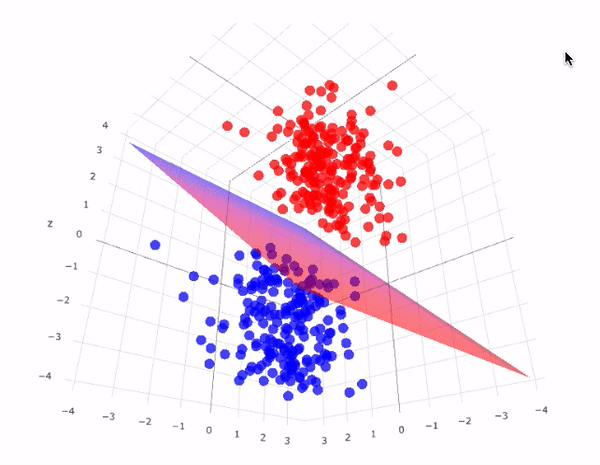

# Hard  Classifier 

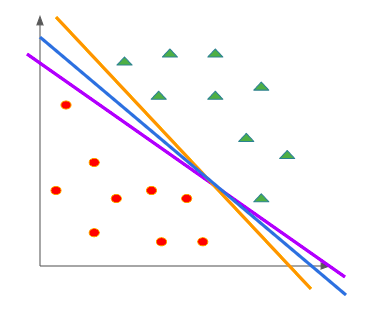

# How do we choose the optimal separating line? 

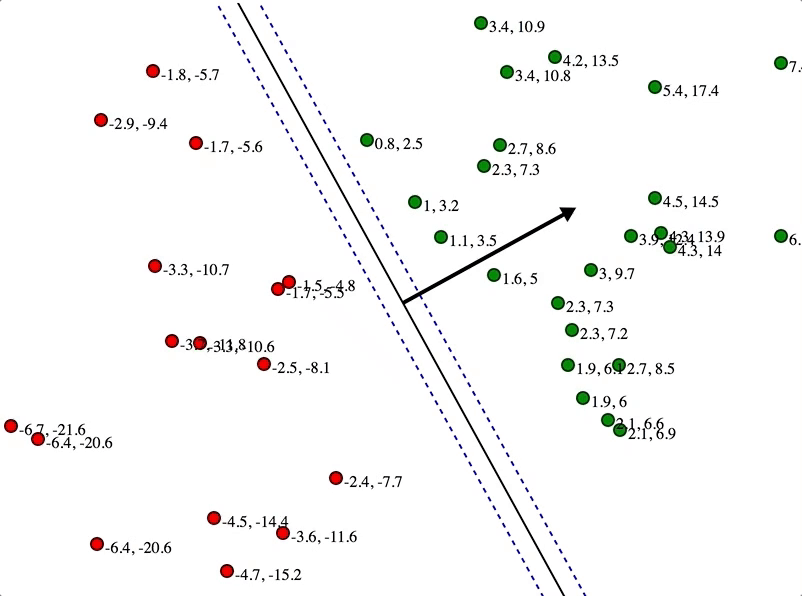

# Maximizing the margin

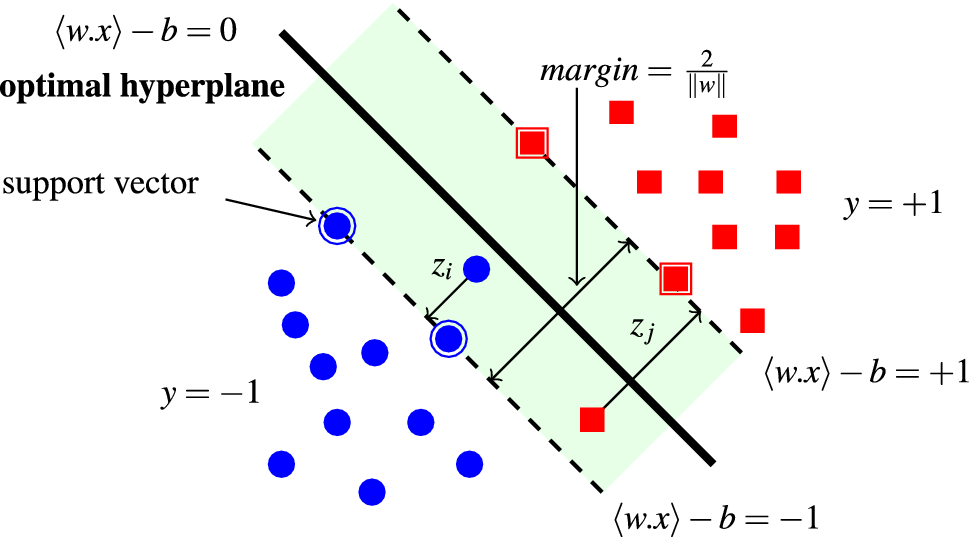

# optimization problem 

# primal problem hard margin

# 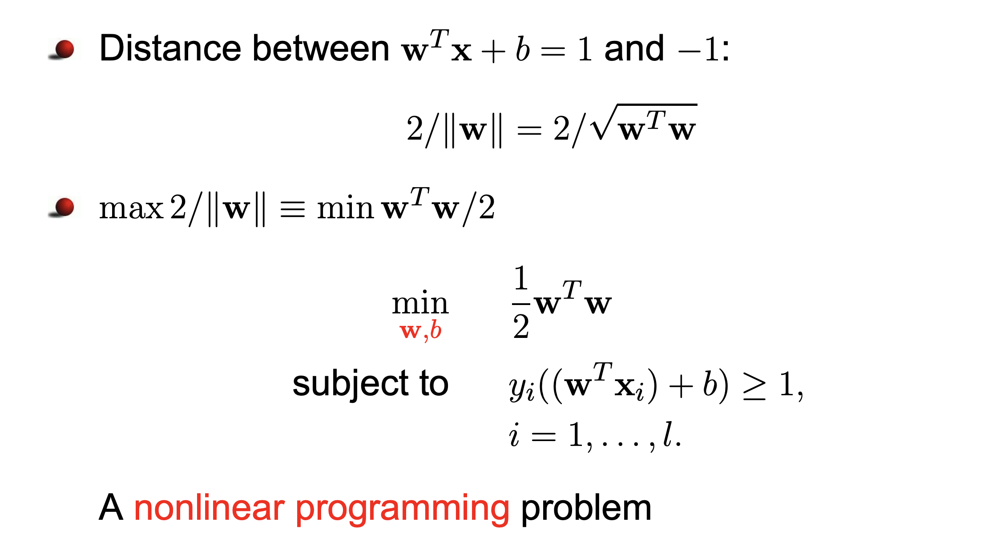

# Import Libraries

In [4]:
import numpy as np
import pandas as pd
#from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
import seaborn as sns
from sklearn import metrics
import matplotlib.pyplot as plt
from IPython.display import Image
from IPython.core.display import HTML 

/Users/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [10]:
#'linear', 'poly', 'rbf', 'sigmoid', 'precomputed'

# iris data

# train 

In [11]:
iris=sns.load_dataset("iris")

In [12]:
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


In [26]:
iris["species"]=iris["species"].map({"setosa":1,"versicolor":2,"virginica":3})

In [27]:
X_train, X_test, y_train, y_test = train_test_split(iris.iloc[:100,2:4],iris.iloc[:100,-1] ,test_size=0.3, shuffle=True) 

In [28]:
X_train.head()

,petal_length,petal_width
50,4.7,1.4
32,1.5,0.1
98,3.0,1.1
75,4.4,1.4
73,4.7,1.2


In [29]:
model=SVC(kernel='linear')

In [30]:
model.fit(X_train,y_train)

SVC(kernel='linear')

In [31]:
metrics.accuracy_score(y_test,model.predict(X_test))

1.0

In [32]:
vec=model.support_vectors_

In [33]:
vec

array([[1.7, 0.5],
       [1.9, 0.2],
       [3. , 1.1]])

In [36]:
set(y_train)

{1, 2}

# plot

No handles with labels found to put in legend.


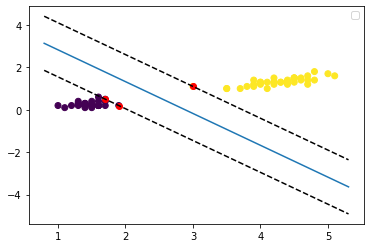

In [35]:
#plt.scatter(X_train[y_train=="setosa"].iloc[:,0],X_train[y_train=="setosa"].iloc[:,1],label="setosa")
#plt.scatter(X_train[y_train=="versicolor"].iloc[:,0],X_train[y_train=="versicolor"].iloc[:,1],label="versicolor")
plt.scatter(X_train.iloc[:,0],X_train.iloc[:,1],c=y_train)

plt.scatter(vec[:,0],vec[:,1],color="red")
ax = plt.gca()
xlim = ax.get_xlim()
w = model.coef_[0]
a = -w[0] / w[1]
xx = np.linspace(xlim[0], xlim[1])
yy = a * xx - model.intercept_[0] / w[1]
plt.plot(xx, yy)
yy = a * xx - (model.intercept_[0] - 1) / w[1]
plt.plot(xx, yy, 'k--')
yy = a * xx - (model.intercept_[0] + 1) / w[1]
plt.plot(xx, yy, 'k--')
plt.legend(loc="best")

In [37]:
data=pd.read_csv("diabetes.csv")

In [38]:
data.head(2)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0


In [39]:
X_train, X_test, y_train, y_test = train_test_split(data.iloc[:,[1,6]],data.iloc[:,-1] ,test_size=0.3, shuffle=True)

In [40]:
model=SVC(kernel='linear')
model.fit(X_train,y_train)
metrics.accuracy_score(y_test,model.predict(X_test))

0.7575757575757576

In [41]:
vec=model.support_vectors_

In [42]:
X_train.head(3)

,Glucose,DiabetesPedigreeFunction
98,93,0.356
761,170,0.403
219,112,0.261


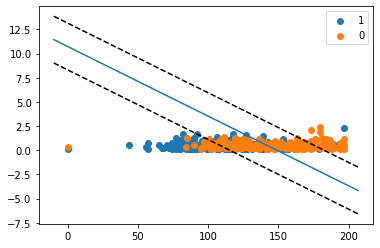

In [46]:
plt.scatter(X_train[y_train==0].iloc[:,0],X_train[y_train==0].iloc[:,1],label="1")
plt.scatter(X_train[y_train==1].iloc[:,0],X_train[y_train==1].iloc[:,1],label="0")
#plt.scatter(vec[:,0],vec[:,1],color="red")
ax = plt.gca()
xlim = ax.get_xlim()
w = model.coef_[0]
a = -w[0] / w[1]
xx = np.linspace(xlim[0], xlim[1])
yy = a * xx - model.intercept_[0] / w[1]
plt.plot(xx, yy)
yy = a * xx - (model.intercept_[0] - 1) / w[1]
plt.plot(xx, yy, 'k--')
yy = a * xx - (model.intercept_[0] + 1) / w[1]
plt.plot(xx, yy, 'k--')
plt.legend(loc="best")

# soft margin using slack variables

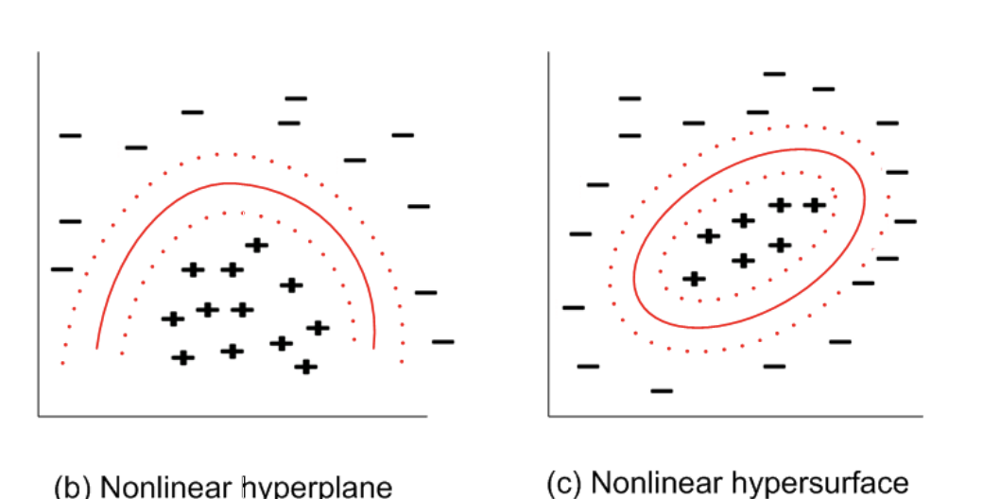

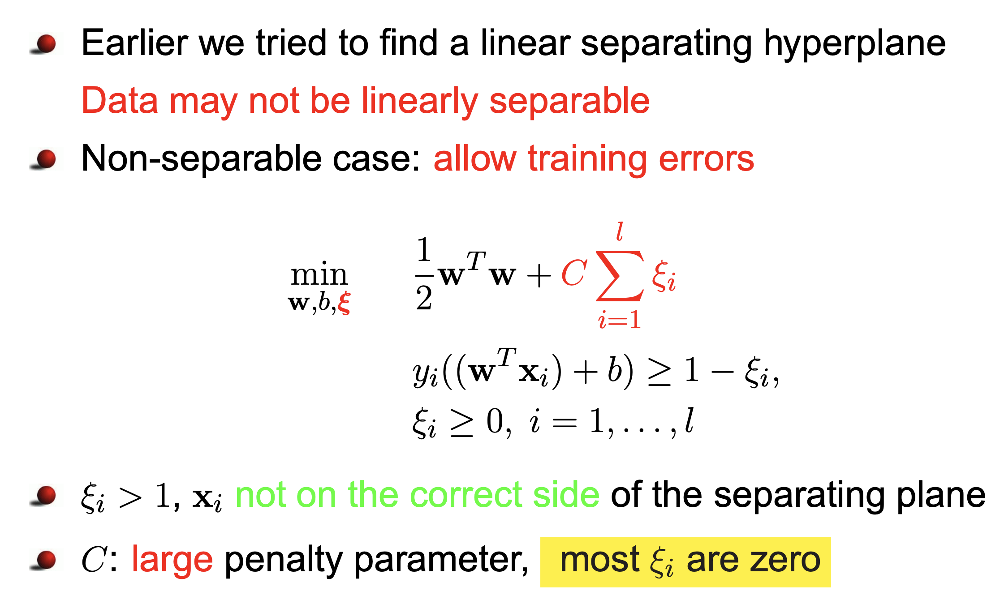

# logisticdrawback.csv

In [47]:
data=pd.read_csv("logisticdrawback.csv")

In [48]:
data.shape

(300, 3)

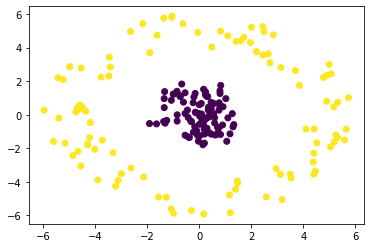

In [49]:
plt.scatter(data.iloc[:200,0],data.iloc[:200,1],c=data.iloc[:200,-1])

In [50]:
X_train, X_test, y_train, y_test = train_test_split(data.iloc[:200,:-1],data.iloc[:200,-1] ,test_size=0.3, shuffle=True) 

In [51]:
model=SVC(kernel='linear')

In [52]:
model.fit(X_train,y_train)

SVC(kernel='linear')

In [53]:
metrics.accuracy_score(y_test,model.predict(X_test))

0.5666666666666667

In [54]:
vec=model.support_vectors_

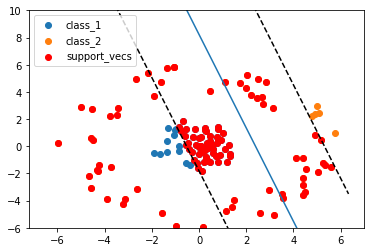

In [55]:
plt.scatter(X_train[y_train==1].iloc[:,0],X_train[y_train==1].iloc[:,1],label="class_1")
plt.scatter(X_train[y_train==2].iloc[:,0],X_train[y_train==2].iloc[:,1],label="class_2")
plt.scatter(vec[:,0],vec[:,1],color="red",label="support_vecs")
plt.ylim(-6,+10)
ax = plt.gca()
xlim = ax.get_xlim()
w = model.coef_[0]
a = -w[0] / w[1]
xx = np.linspace(xlim[0], xlim[1])
yy = a * xx - model.intercept_[0] / w[1]
plt.plot(xx, yy)
yy = a * xx - (model.intercept_[0] - 1) / w[1]
plt.plot(xx, yy, 'k--')
yy = a * xx - (model.intercept_[0] + 1) / w[1]
plt.plot(xx, yy, 'k--')
plt.legend(loc="best")

# using rbf

In [56]:
data=pd.read_csv("logisticdrawback.csv")

In [57]:
X_train, X_test, y_train, y_test = train_test_split(data.iloc[:200,:-1],data.iloc[:200,-1] ,test_size=0.3, shuffle=True) 

In [58]:
model=SVC(kernel='rbf',gamma=1)

In [59]:
model.fit(X_train,y_train)

SVC(gamma=1)

In [60]:
metrics.accuracy_score(y_test,model.predict(X_test))

1.0

In [46]:
vec=model.support_vectors_

In [47]:
vec

array([[-1.33547361,  1.3762356 ],
       [-0.86005804,  1.3922934 ],
       [-0.38376178, -1.36023835],
       [-1.64818908, -0.54929524],
       [-1.37386474, -0.41051708],
       [ 0.23281199,  1.19498071],
       [ 0.8250868 ,  1.74770601],
       [ 1.05707212, -1.5849058 ],
       [ 0.19449442, -1.69509988],
       [ 1.26893289,  0.06322357],
       [-0.13135059,  0.11904256],
       [ 2.44369369,  5.25143347],
       [ 3.18713298, -5.05956332],
       [ 5.59180404, -1.50701936],
       [-3.22405571, -4.26484158],
       [-5.6161954 , -1.59506056],
       [-4.99021677,  2.86304167],
       [ 1.19229241, -5.84923076],
       [ 1.47252122, -4.0873588 ],
       [-5.9742012 ,  0.26459572],
       [ 2.84807405,  4.75503348],
       [ 4.1048444 , -0.8556285 ],
       [-4.86699521, -2.43997032],
       [ 3.5347451 , -3.77661188],
       [ 0.47971279,  4.03078897],
       [ 0.81754689,  4.97376731],
       [ 5.32969367,  0.73904671],
       [-0.99638172, -5.87367329],
       [-2.14257718,

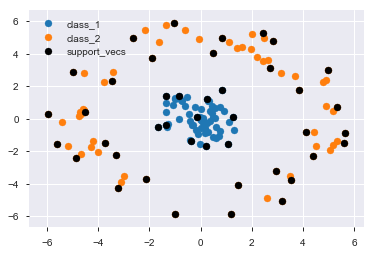

In [48]:
vec=model.support_vectors_
plt.scatter(X_train[y_train==1].iloc[:,0],X_train[y_train==1].iloc[:,1],label="class_1")
plt.scatter(X_train[y_train==2].iloc[:,0],X_train[y_train==2].iloc[:,1],label="class_2")
plt.scatter(vec[:,0],vec[:,1],color="black",label="support_vecs")
plt.legend(loc="best")

In [100]:
#'linear', 'poly', 'rbf', 'sigmoid', 'precomputed' 

In [ ]:
# data=pd.read_csv("winequality-white.csv",sep=";")
# model = SVC(kernel='linear', C=50)


# X_train, X_test, y_train, y_test = train_test_split(data.iloc[:,:-1],data.iloc[:,-1] ,test_size=0.3, shuffle=True) 
# model.fit(X_train,y_train)
# metrics.accuracy_score(y_test,model.predict(X_test))

# SVR

In [49]:
from sklearn.svm import SVR

In [57]:
X = np.sort(5 * np.random.rand(40, 1), axis=0)
y = np.sin(X).ravel()


In [51]:
y[::5] += 3 * (0.5 - np.random.rand(8))

In [ ]:
??SVR

In [52]:
rbf = SVR(kernel='rbf', C=100,  epsilon=.1)
lin = SVR(kernel='linear', C=100)
poly = SVR(kernel='poly', C=100, degree=3, epsilon=.1,
               coef0=1)


/Users/somnathmondal/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/Users/somnathmondal/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


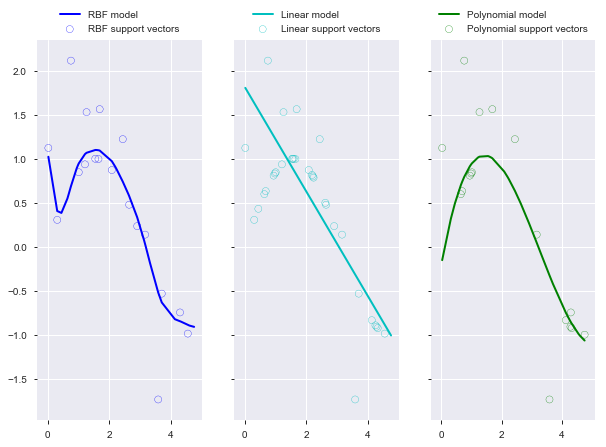

In [53]:
lw = 2

svrs = [rbf, lin, poly]
kernel_label = ['RBF', 'Linear', 'Polynomial']
model_color = ['b', 'c', 'g']

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 7), sharey=True)
for ix, svr in enumerate(svrs):
    axes[ix].plot(X, svr.fit(X, y).predict(X), color=model_color[ix], lw=lw,
                  label='{} model'.format(kernel_label[ix]))
    axes[ix].scatter(X[svr.support_], y[svr.support_], facecolor="none",
                     edgecolor=model_color[ix], s=50,
                     label='{} support vectors'.format(kernel_label[ix]))
    axes[ix].scatter(X[np.setdiff1d(np.arange(len(X)), svr.support_)],
                     y[np.setdiff1d(np.arange(len(X)), svr.support_)],
                     facecolor="none", edgecolor="k", s=50,
                     label='other training data')
    axes[ix].legend(loc='upper center', bbox_to_anchor=(0.5, 1.1),
                    ncol=1, fancybox=True, shadow=True)


# Visu

In [6]:
from matplotlib.colors import ListedColormap

In [7]:
def versiontuple(v):
    return tuple(map(int, (v.split("."))))


def plot_decision_regions(X, y, classifier, test_idx=None, resolution=0.02):

    # setup marker generator and color map
    markers = ('s', 'x', 'o', '^', 'v')
    colors = ('red', 'blue', 'lightgreen', 'gray', 'cyan')
    cmap = ListedColormap(colors[:len(np.unique(y))])

    # plot the decision surface
    x1_min, x1_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    x2_min, x2_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx1, xx2 = np.meshgrid(np.arange(x1_min, x1_max, resolution),
                           np.arange(x2_min, x2_max, resolution))
    Z = classifier.predict(np.array([xx1.ravel(), xx2.ravel()]).T)
    Z = Z.reshape(xx1.shape)
    plt.contourf(xx1, xx2, Z, alpha=0.4, cmap=cmap)
    plt.xlim(xx1.min(), xx1.max())
    plt.ylim(xx2.min(), xx2.max())

    for idx, cl in enumerate(np.unique(y)):
        plt.scatter(x=X[y == cl, 0], y=X[y == cl, 1],
                    alpha=0.8, c=cmap(idx),
                    marker=markers[idx], label=cl)

    # highlight test samples
    if test_idx:
        # plot all samples
        if not versiontuple(np.__version__) >= versiontuple('1.9.0'):
            X_test, y_test = X[list(test_idx), :], y[list(test_idx)]
            warnings.warn('Please update to NumPy 1.9.0 or newer')
        else:
            X_test, y_test = X[test_idx, :], y[test_idx]

        plt.scatter(X_test[:, 0],
                    X_test[:, 1],
                    c='',
                    alpha=1.0,
                    linewidths=1,
                    marker='o',
                    s=55, label='test set')

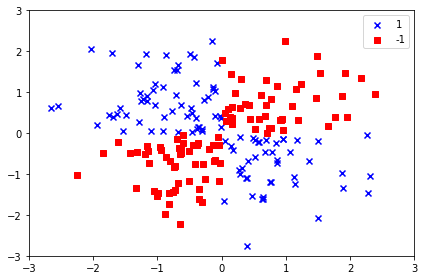

In [8]:
np.random.seed(0)
X_xor = np.random.randn(200, 2)
y_xor = np.logical_xor(X_xor[:, 0] > 0,
                       X_xor[:, 1] > 0)
y_xor = np.where(y_xor, 1, -1)

plt.scatter(X_xor[y_xor == 1, 0],
            X_xor[y_xor == 1, 1],
            c='b', marker='x',
            label='1')
plt.scatter(X_xor[y_xor == -1, 0],
            X_xor[y_xor == -1, 1],
            c='r',
            marker='s',
            label='-1')

plt.xlim([-3, 3])
plt.ylim([-3, 3])
plt.legend(loc='best')
plt.tight_layout()
plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


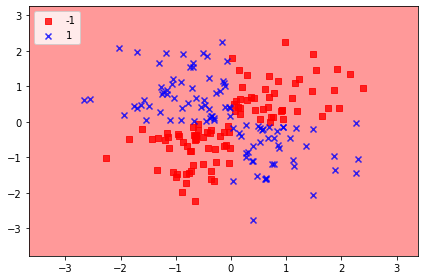

In [9]:
# Create a SVC classifier using an RBF kernel
svm = SVC(kernel='rbf', random_state=0, gamma=0.0001, C=1)
# Train the classifier
svm.fit(X_xor, y_xor)

# Visualize the decision boundaries
plot_decision_regions(X_xor, y_xor, classifier=svm)
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


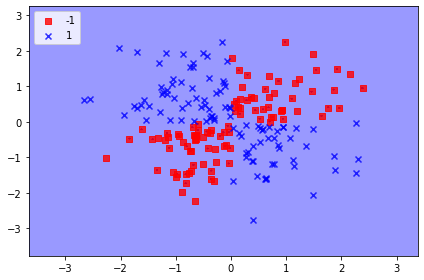

In [11]:
# Create a SVC classifier using an RBF kernel
svm = SVC(kernel='rbf', random_state=0, gamma=50000, C=1)
# Train the classifier
svm.fit(X_xor, y_xor)

# Visualize the decision boundaries
plot_decision_regions(X_xor, y_xor, classifier=svm)
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()

In [32]:
data=pd.read_csv("fun-data.csv")

In [33]:
data.head()

,f1,f2,f3,class
0,8.477937,0.436289,40.389470,1
1,6.704407,6.237227,65.349761,1
2,4.835130,4.500931,52.093300,1
3,5.179056,9.523951,79.049424,1
4,5.030426,4.569668,51.970028,1


In [34]:
data.columns=["f1","f2","f3","clas44"]

In [35]:
features=[col for col in data.columns if col!="class"]
print(features)
data_x=data[features];
data_y=data.clas44

['f1', 'f2', 'f3', 'clas44']


In [37]:
data.class()

SyntaxError: invalid syntax (<ipython-input-37-be191954922f>, line 1)

In [ ]:
1,2,3,4,5,6
1.5,3.5,5.5



In [ ]:
1,2,3,4,5,6,7,8,9
